In [1]:
# Import libraries
import h5py
import numpy as np
import random
import os
import librosa
import librosa.display
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, LSTM,SimpleRNN
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.layers import Dropout
from tensorflow.keras.optimizers import Adam
from keras.models import Sequential
import matplotlib.pyplot as plt
from tensorflow.keras.utils import to_categorical
from sklearn.metrics import confusion_matrix
import seaborn as sns
from scipy.signal import spectrogram
from scipy import signal
from tensorflow.keras.models import load_model
import pandas as pd
import warnings
warnings.filterwarnings("ignore")

In [2]:
f = h5py.File('spectrograms.h5', 'r')
list(f.keys())

['amecro',
 'barswa',
 'bkcchi',
 'blujay',
 'daejun',
 'houfin',
 'mallar3',
 'norfli',
 'rewbla',
 'stejay',
 'wesmea',
 'whcspa']

In [3]:
list(f.items())

[('amecro', <HDF5 dataset "amecro": shape (256, 343, 52), type "<f8">),
 ('barswa', <HDF5 dataset "barswa": shape (256, 343, 55), type "<f8">),
 ('bkcchi', <HDF5 dataset "bkcchi": shape (256, 343, 57), type "<f8">),
 ('blujay', <HDF5 dataset "blujay": shape (256, 343, 50), type "<f8">),
 ('daejun', <HDF5 dataset "daejun": shape (256, 343, 58), type "<f8">),
 ('houfin', <HDF5 dataset "houfin": shape (256, 343, 44), type "<f8">),
 ('mallar3', <HDF5 dataset "mallar3": shape (256, 343, 36), type "<f8">),
 ('norfli', <HDF5 dataset "norfli": shape (256, 343, 59), type "<f8">),
 ('rewbla', <HDF5 dataset "rewbla": shape (256, 343, 41), type "<f8">),
 ('stejay', <HDF5 dataset "stejay": shape (256, 343, 40), type "<f8">),
 ('wesmea', <HDF5 dataset "wesmea": shape (256, 343, 36), type "<f8">),
 ('whcspa', <HDF5 dataset "whcspa": shape (256, 343, 51), type "<f8">)]

Times shape: (1,)
Frequencies shape: (27,)
Spectrogram shape: (256, 343, 27)


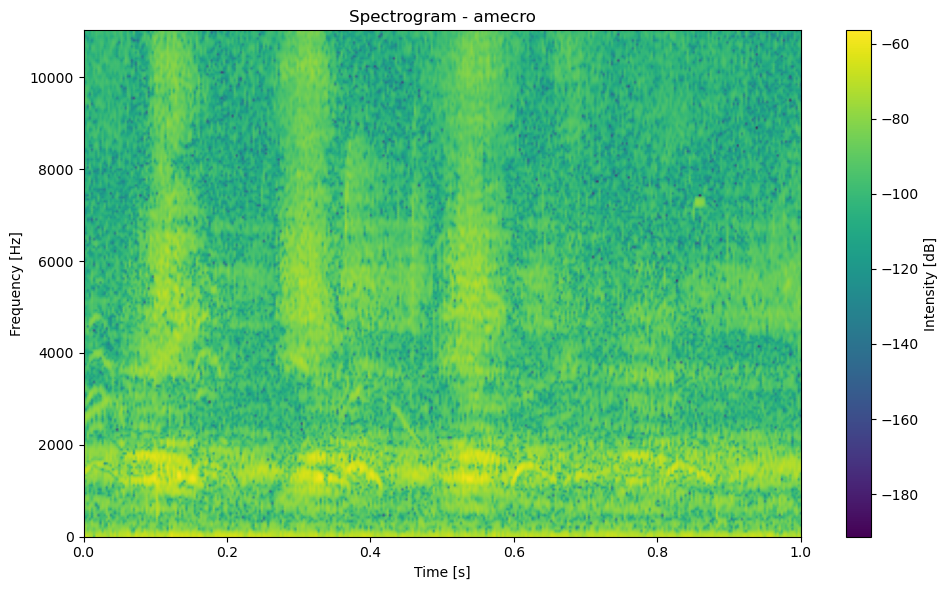

Times shape: (1,)
Frequencies shape: (28,)
Spectrogram shape: (256, 343, 28)


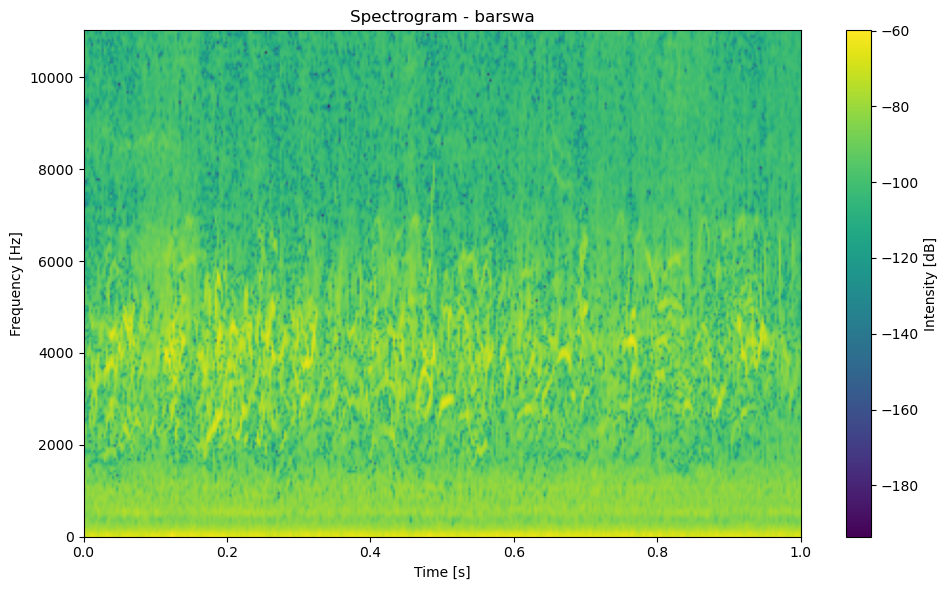

Times shape: (1,)
Frequencies shape: (29,)
Spectrogram shape: (256, 343, 29)


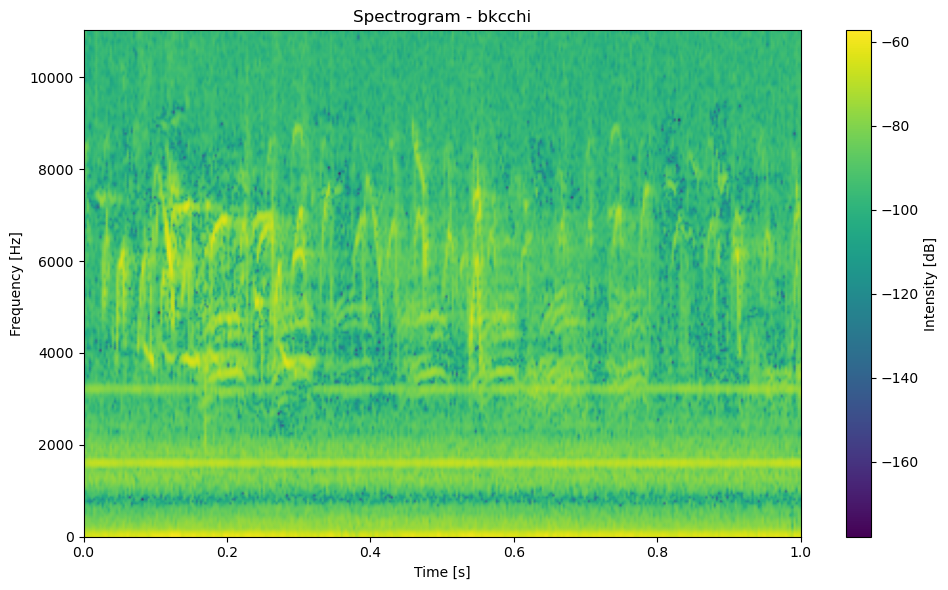

Times shape: (1,)
Frequencies shape: (26,)
Spectrogram shape: (256, 343, 26)


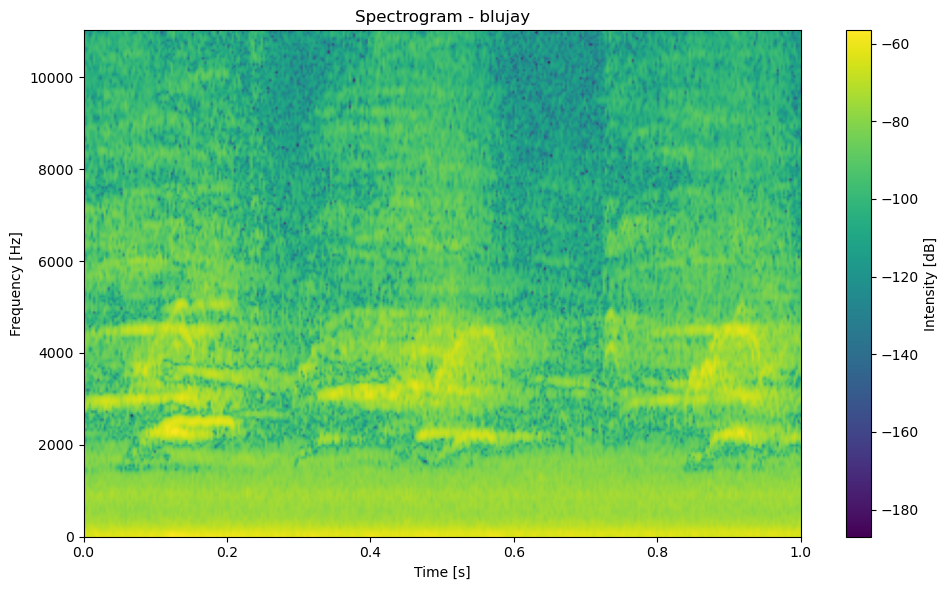

Times shape: (1,)
Frequencies shape: (30,)
Spectrogram shape: (256, 343, 30)


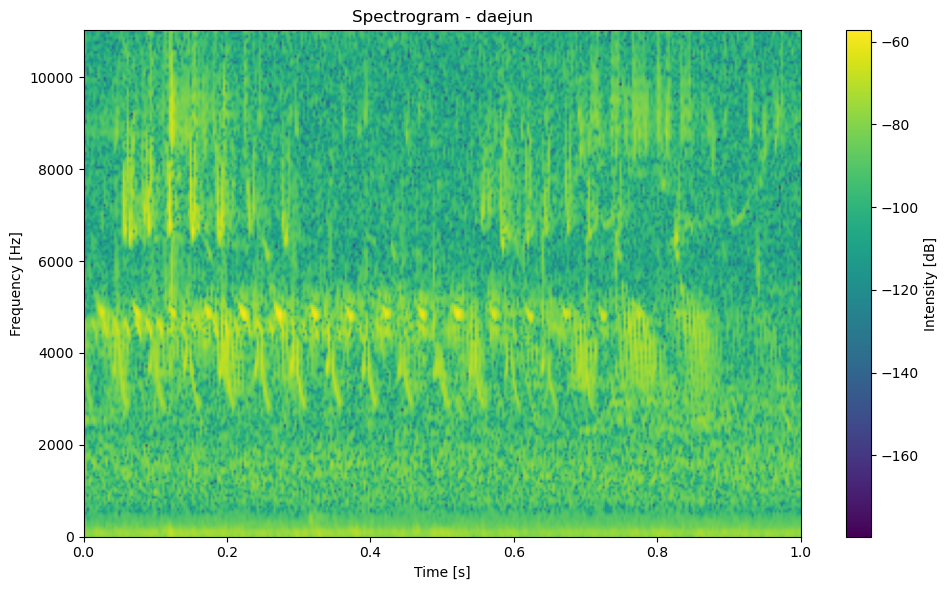

Times shape: (1,)
Frequencies shape: (23,)
Spectrogram shape: (256, 343, 23)


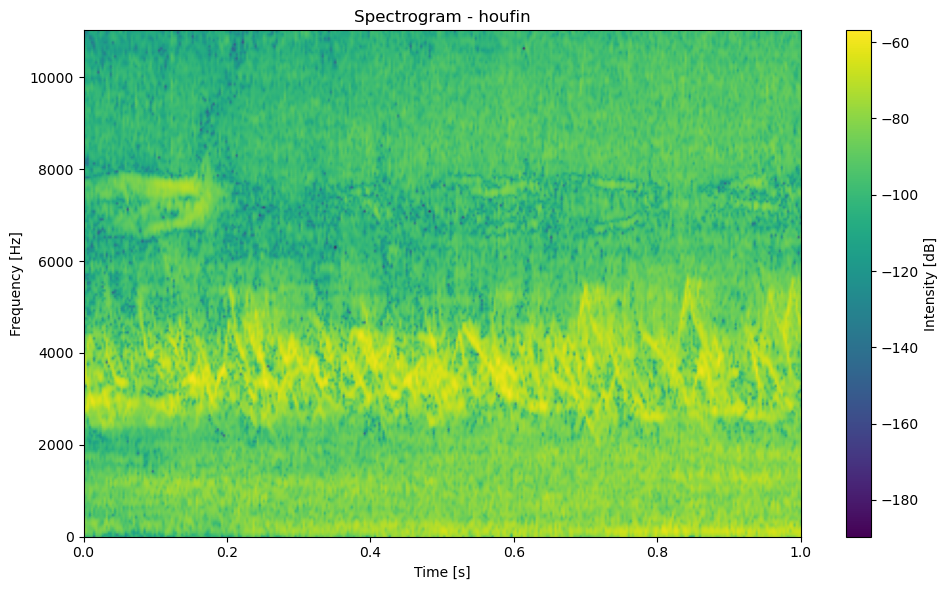

Times shape: (1,)
Frequencies shape: (19,)
Spectrogram shape: (256, 343, 19)


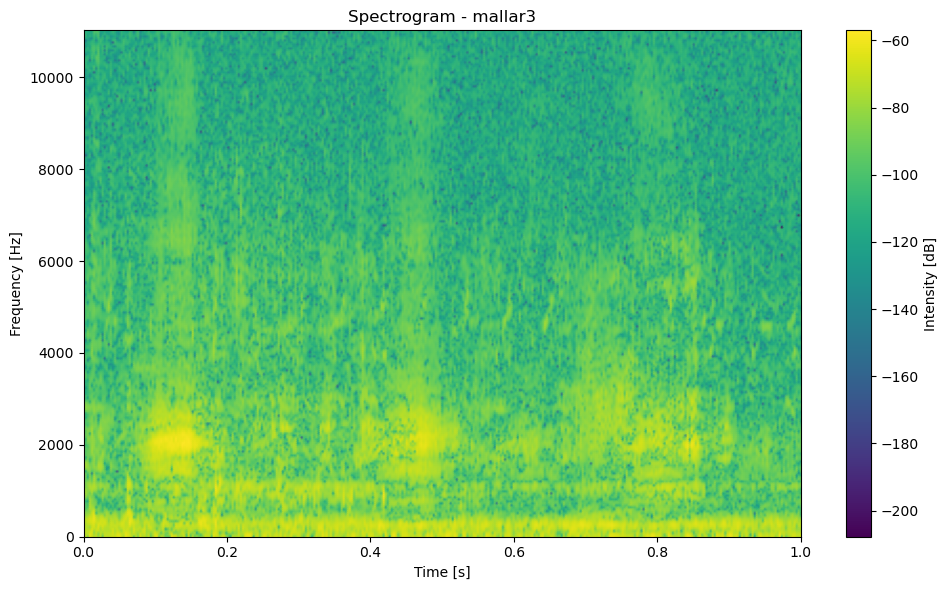

Times shape: (1,)
Frequencies shape: (30,)
Spectrogram shape: (256, 343, 30)


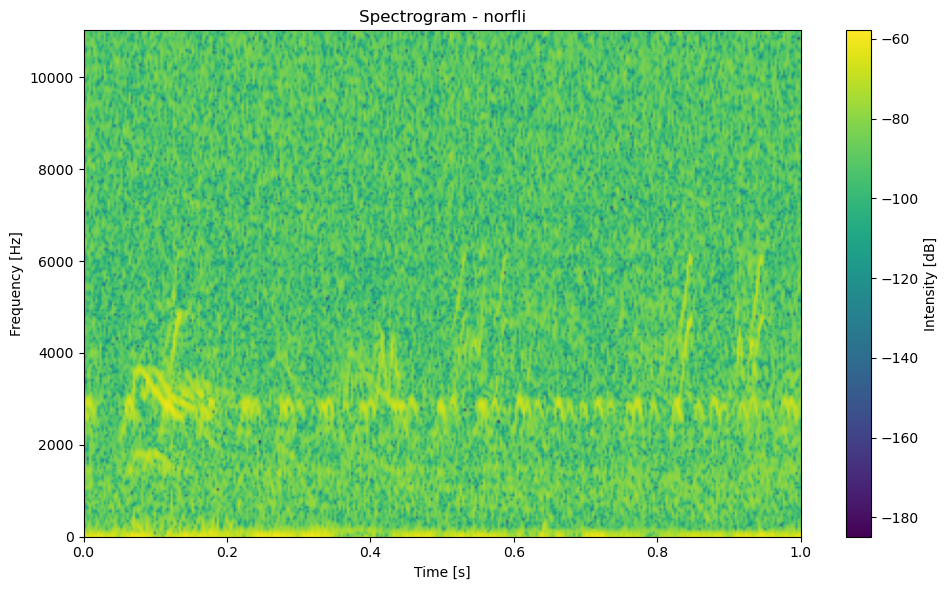

Times shape: (1,)
Frequencies shape: (21,)
Spectrogram shape: (256, 343, 21)


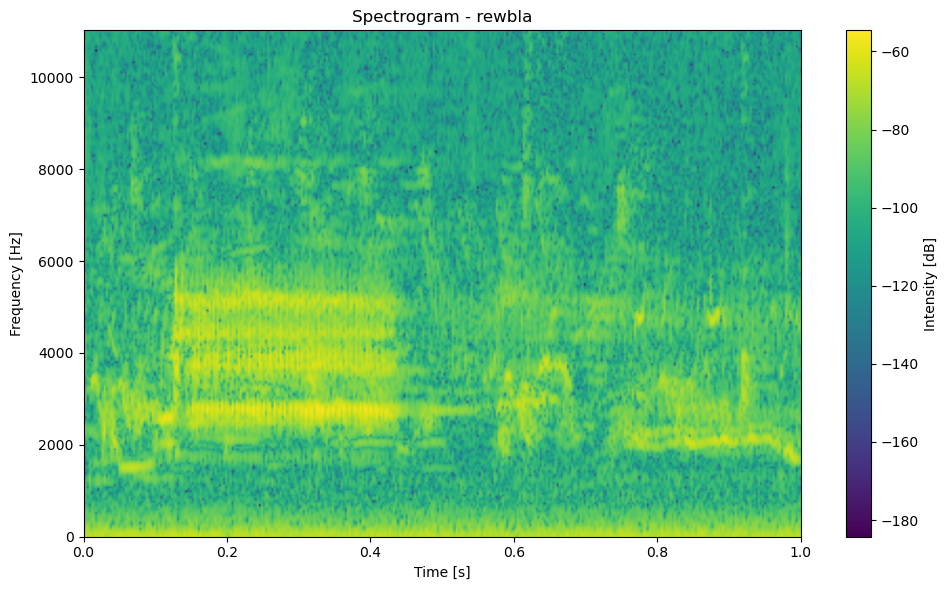

Times shape: (1,)
Frequencies shape: (21,)
Spectrogram shape: (256, 343, 21)


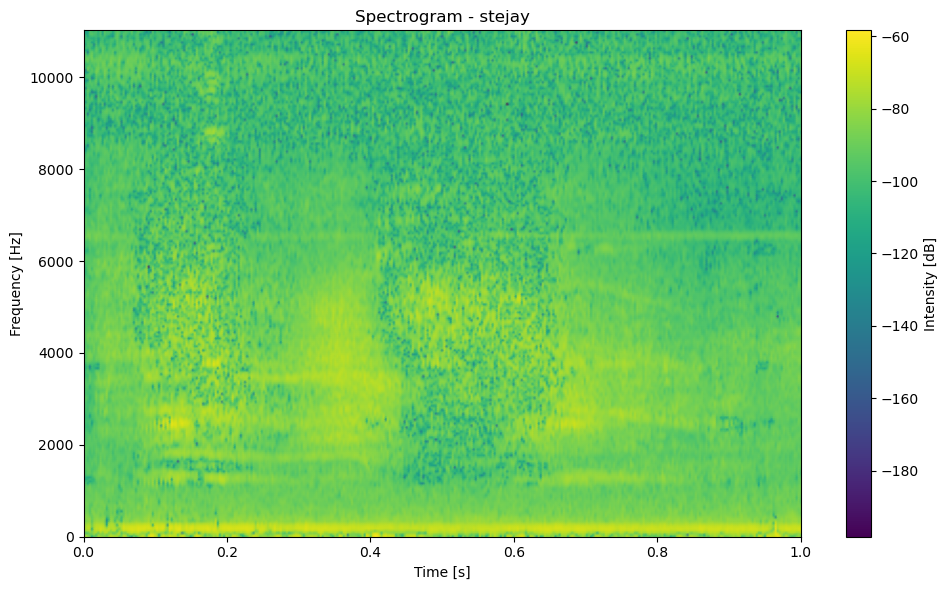

Times shape: (1,)
Frequencies shape: (19,)
Spectrogram shape: (256, 343, 19)


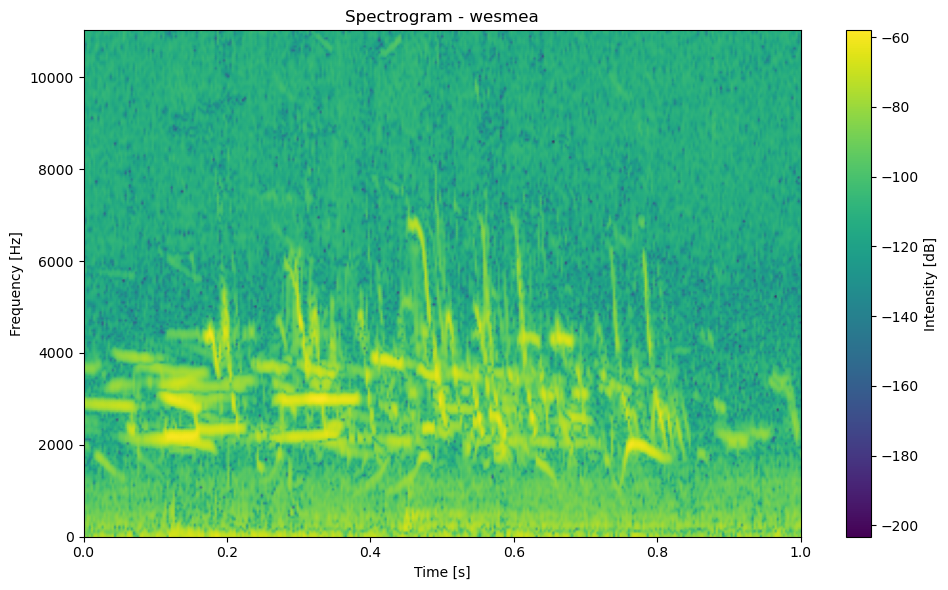

Times shape: (1,)
Frequencies shape: (26,)
Spectrogram shape: (256, 343, 26)


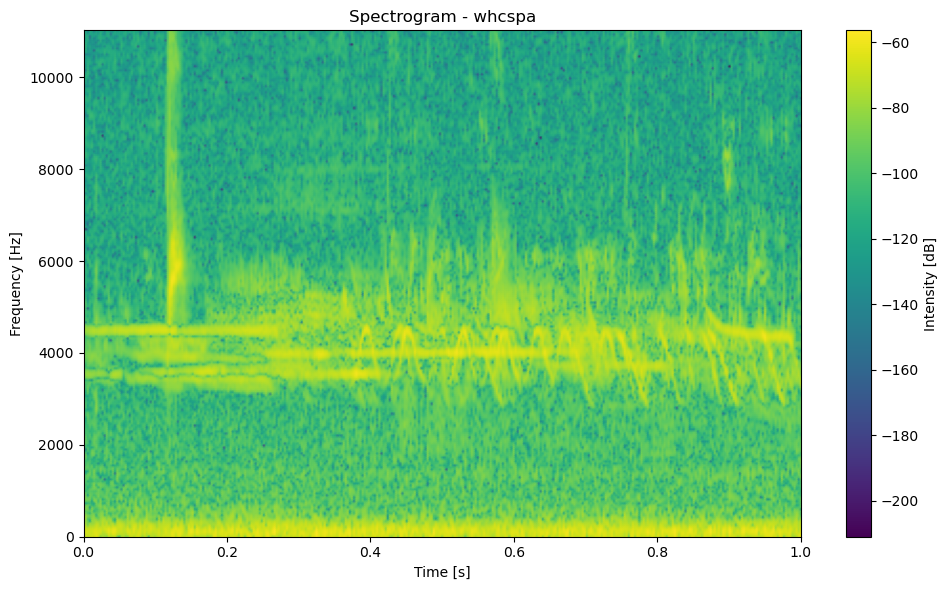

In [4]:
for species, dataset in f.items():
    spectrogram_data = np.array(dataset)
    frequencies, times, spectrogram = signal.spectrogram(spectrogram_data, fs=22050)
    spectrogram = np.squeeze(spectrogram)
    print("Times shape:", times.shape)
    print("Frequencies shape:", frequencies.shape)
    print("Spectrogram shape:", spectrogram.shape)
    
    if times.shape[0] != spectrogram.shape[1]:
        times = np.linspace(0, 1, spectrogram.shape[1]) 
    
    if frequencies.shape[0] != spectrogram.shape[0]:
        frequencies = np.linspace(0, 22050 / 2, spectrogram.shape[0])
    
    # Plot the spectrogram
    plt.figure(figsize=(10, 6))
    plt.pcolormesh(times, frequencies, 10 * np.log10(spectrogram[:, :, 0]), shading='gouraud', cmap='viridis')
    plt.title(f"Spectrogram - {species}")
    plt.xlabel("Time [s]")
    plt.ylabel("Frequency [Hz]")
    plt.colorbar(label='Intensity [dB]')
    plt.tight_layout()
    plt.show()


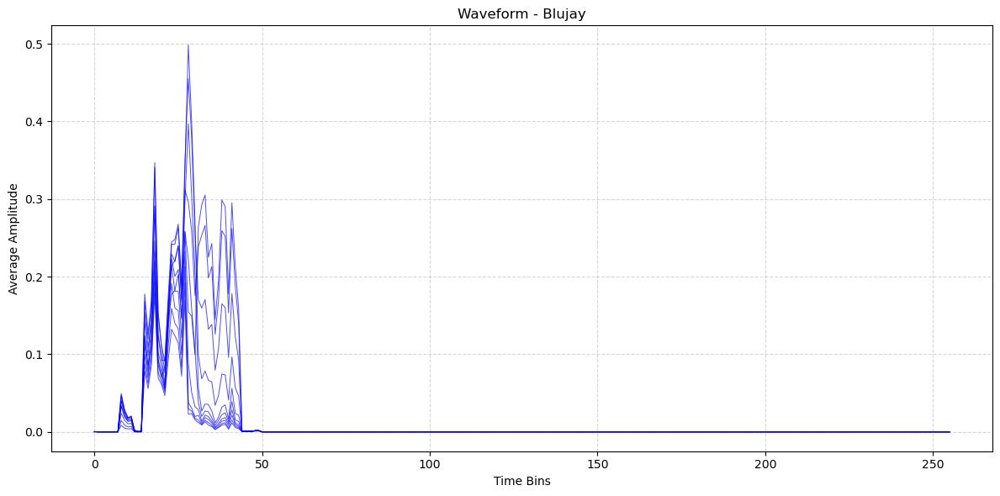

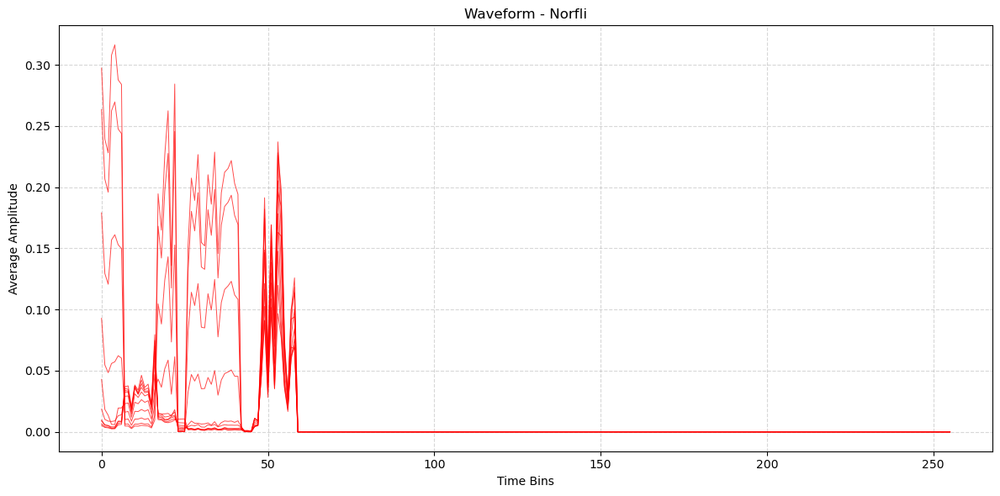

Features shape: (512, 343, 256)
Labels shape: (512,)


In [5]:
def preprocess_features(data, target_shape=(343, 256)):
    if data.shape[1:] < target_shape:
        padding = np.zeros((data.shape[0], target_shape[0], target_shape[1] - data.shape[2]))
        data = np.concatenate((data, padding), axis=2)
    elif data.shape[1:] > target_shape:
        data = data[:, :target_shape[0], :target_shape[1]]
    return data
blujay_features = []
norfli_features = []
labels = []

for key in f.keys():
    data = np.array(f[key])
    if key == 'blujay':
        processed_data = preprocess_features(data)
        blujay_features.append(processed_data)
        labels.extend([0] * processed_data.shape[0])  # Label '0' for blujay
    elif key == 'norfli':
        processed_data = preprocess_features(data)
        norfli_features.append(processed_data)
        labels.extend([1] * processed_data.shape[0])  # Label '1' for norfli

blujay_features = np.concatenate(blujay_features, axis=0)
norfli_features = np.concatenate(norfli_features, axis=0)

features = np.concatenate((blujay_features, norfli_features), axis=0)
labels = np.array(labels)

def plot_waveform(features, title, color):
    plt.figure(figsize=(12, 6))
    for i in range(min(features.shape[0], 10)): 
        plt.plot(features[i].mean(axis=0), color=color, alpha=0.7, linewidth=0.7)  
    plt.title(title)
    plt.xlabel('Time Bins')
    plt.ylabel('Average Amplitude')
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()


plot_waveform(blujay_features, 'Waveform - Blujay', 'blue')
plot_waveform(norfli_features, 'Waveform - Norfli', 'red')

print("Features shape:", features.shape)
print("Labels shape:", labels.shape)

In [6]:
np.random.seed(123)
X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=0.3, random_state=123)
X_train = X_train.reshape(-1, 343, 256, 1)  
X_test = X_test.reshape(-1, 343, 256, 1)

In [7]:
print("Size of X_train:", X_train.shape)
print("Size of X_test:", X_test.shape)
print("Size of y_train:", y_train.shape)
print("Size of y_test:", y_test.shape)

Size of X_train: (358, 343, 256, 1)
Size of X_test: (154, 343, 256, 1)
Size of y_train: (358,)
Size of y_test: (154,)


## Binary Model

In [ ]:
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(343, 256, 1)),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(128, activation='relu'),
    Dense(1, activation='sigmoid')
])

In [ ]:
model.compile(optimizer=Adam()
              , loss='binary_crossentropy'
              , metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=10, batch_size=8, validation_data=(X_test, y_test))

In [ ]:
plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.plot(history.history['loss'], label='loss')
plt.plot(history.history['val_loss'], label='val_loss')
plt.title('Model performance')
plt.xlabel('Epoch')
plt.ylabel('Performance')
plt.legend()
plt.show()

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

### With increased epoch to 20 and batch size to 16

In [ ]:
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(343, 256, 1)),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(128, activation='relu'),
    Dense(1, activation='sigmoid')
])

In [ ]:
model.compile(optimizer=Adam()
              , loss='binary_crossentropy'
              , metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=20, batch_size=16, validation_data=(X_test, y_test))

In [ ]:
plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.plot(history.history['loss'], label='loss')
plt.plot(history.history['val_loss'], label='val_loss')
plt.title('Model performance')
plt.xlabel('Epoch')
plt.ylabel('Performance')
plt.legend()
plt.show()

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

### With increased epoch to 20 and batch size to 32

In [ ]:
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(343, 256, 1)),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(128, activation='relu'),
    Dense(1, activation='sigmoid')
])

In [ ]:
model.compile(optimizer=Adam()
              , loss='binary_crossentropy'
              , metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=20, batch_size=32, validation_data=(X_test, y_test))

In [ ]:
plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.plot(history.history['loss'], label='loss')
plt.plot(history.history['val_loss'], label='val_loss')
plt.title('Model performance')
plt.xlabel('Epoch')
plt.ylabel('Performance')
plt.legend()
plt.show()

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

## With Dropout

In [ ]:
modeldrop = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(343, 256, 1)),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(64, activation='relu'),  
    Dense(1, activation='sigmoid')
])

In [ ]:
modeldrop.compile(optimizer=Adam()
              , loss='binary_crossentropy'
              , metrics=['accuracy'])

historydrop = modeldrop.fit(X_train, y_train, epochs=20, batch_size=32, validation_data=(X_test, y_test))

In [ ]:
plt.plot(historydrop.history['accuracy'], label='accuracy')
plt.plot(historydrop.history['val_accuracy'], label='val_accuracy')
plt.plot(historydrop.history['loss'], label='loss')
plt.plot(historydrop.history['val_loss'], label='val_loss')
plt.title('Model performance')
plt.xlabel('Epoch')
plt.ylabel('Performance')
plt.legend()
plt.show()

In [ ]:
test_loss, test_accuracy = modeldrop.evaluate(X_test, y_test)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

### RNN model

In [ ]:
X_train_rnn = X_train.reshape(X_train.shape[0], X_train.shape[1], X_train.shape[2])
X_test_rnn = X_test.reshape(X_test.shape[0], X_test.shape[1], X_test.shape[2])

rnn_binmodel = Sequential([
    SimpleRNN(64, input_shape=(X_train_rnn.shape[1], X_train_rnn.shape[2])), 
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(64, activation='relu'),
    Dense(1, activation='sigmoid')  
])

rnn_binmodel.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])

history_binrnn = rnn_binmodel.fit(X_train_rnn, y_train, epochs=20, batch_size=32, validation_data=(X_test_rnn, y_test))

In [ ]:
plt.plot(history_binrnn.history['accuracy'], label='accuracy')
plt.plot(history_binrnn.history['val_accuracy'], label='val_accuracy')
plt.plot(history_binrnn.history['loss'], label='loss')
plt.plot(history_binrnn.history['val_loss'], label='val_loss')
plt.title('Model performance')
plt.xlabel('Epoch')
plt.ylabel('Performance')
plt.legend()
plt.show()

In [ ]:
test_loss, test_accuracy = rnn_binmodel.evaluate(X_test_rnn, y_test)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

## Multi Class Model

In [8]:
from skimage.transform import resize
keys = list(f.keys())  

features = []  
y = []  

for key in keys:
    if f[key].shape[0] > 0:  
        resized_spectrogram = resize(f[key][:], (f[key].shape[0], 343, 256),mode='constant', cval=0, anti_aliasing=True)
        features.append(resized_spectrogram)  
        y.extend([key] * resized_spectrogram.shape[0])  

features = np.concatenate(features, axis=0)
y = np.array(y)

label_encoding = {species: idx for idx, species in enumerate(keys)}
labels = np.array([label_encoding[label] for label in y])

labels_one_hot = to_categorical(labels)

print("Features shape:", features.shape)
print("Labels shape:", labels_one_hot.shape)

Features shape: (3072, 343, 256)
Labels shape: (3072, 12)


In [9]:
np.random.seed(123)
X_train, X_test, y_train, y_test = train_test_split(features, labels_one_hot, test_size=0.3, random_state=123)

In [10]:
print("Size of X_train:", X_train.shape)
print("Size of X_test:", X_test.shape)
print("Size of y_train:", y_train.shape)
print("Size of y_test:", y_test.shape)

Size of X_train: (2150, 343, 256)
Size of X_test: (922, 343, 256)
Size of y_train: (2150, 12)
Size of y_test: (922, 12)


In [11]:
multimodel = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(343, 256, 1)),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(128, activation='relu'),
    Dense(len(np.unique(labels)), activation='softmax') 
])

multimodel.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])


In [12]:
multimodel.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 341, 254, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 170, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 168, 125, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 84, 62, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 82, 60, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 41, 30, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 157440)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │    20,152,448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 12)             │         1,548 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 20,246,668 (77.23 MB)

 Trainable params: 20,246,668 (77.23 MB)

 Non-trainable params: 0 (0.00 B)

In [13]:
historymulti = multimodel.fit(X_train, y_train, epochs=10, batch_size=8, validation_data=(X_test, y_test))

Epoch 1/10
269/269 ━━━━━━━━━━━━━━━━━━━━ 52s 191ms/step - accuracy: 0.7238 - loss: 1.1419 - val_accuracy: 0.9957 - val_loss: 0.0312
Epoch 2/10
269/269 ━━━━━━━━━━━━━━━━━━━━ 51s 190ms/step - accuracy: 0.9996 - loss: 0.0028 - val_accuracy: 1.0000 - val_loss: 2.3167e-04
Epoch 3/10
269/269 ━━━━━━━━━━━━━━━━━━━━ 51s 190ms/step - accuracy: 1.0000 - loss: 1.2756e-04 - val_accuracy: 1.0000 - val_loss: 7.3672e-05
Epoch 4/10
269/269 ━━━━━━━━━━━━━━━━━━━━ 51s 188ms/step - accuracy: 1.0000 - loss: 7.6779e-05 - val_accuracy: 1.0000 - val_loss: 4.5104e-05
Epoch 5/10
269/269 ━━━━━━━━━━━━━━━━━━━━ 51s 188ms/step - accuracy: 1.0000 - loss: 5.1295e-05 - val_accuracy: 1.0000 - val_loss: 3.4766e-05
Epoch 6/10
269/269 ━━━━━━━━━━━━━━━━━━━━ 51s 189ms/step - accuracy: 1.0000 - loss: 3.0792e-05 - val_accuracy: 1.0000 - val_loss: 2.7845e-05
Epoch 7/10
269/269 ━━━━━━━━━━━━━━━━━━━━ 51s 189ms/step - accuracy: 1.0000 - loss: 2.4251e-05 - val_accuracy: 1.0000 - val_loss: 2.2962e-05
Epoch 8/10
269/269 ━━━━━━━━━━━━━━━━━━━━

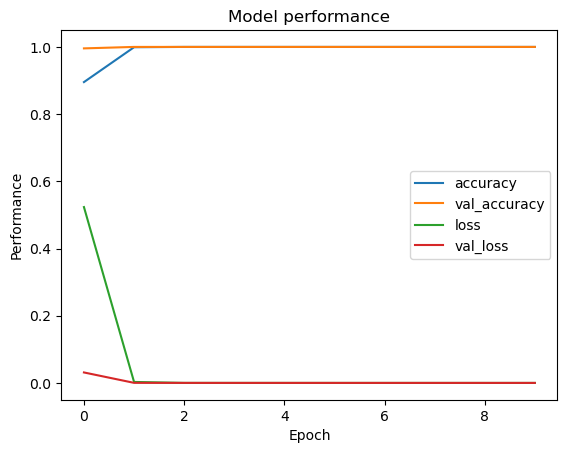

In [14]:
plt.plot(historymulti.history['accuracy'], label='accuracy')
plt.plot(historymulti.history['val_accuracy'], label='val_accuracy')
plt.plot(historymulti.history['loss'], label='loss')
plt.plot(historymulti.history['val_loss'], label='val_loss')
plt.title('Model performance')
plt.xlabel('Epoch')
plt.ylabel('Performance')
plt.legend()
plt.show()

In [15]:
test_loss, test_accuracy = multimodel.evaluate(X_test, y_test)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 173ms/step - accuracy: 1.0000 - loss: 1.1421e-05
Test Loss: 1.655558116908651e-05
Test Accuracy: 1.0


### With increased epoch to 20 and batch size to 16

In [ ]:
multimodel = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(343, 256, 1)),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(128, activation='relu'),
    Dense(len(np.unique(labels)), activation='softmax') 
])

multimodel.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])


In [ ]:
historymulti = multimodel.fit(X_train, y_train, epochs=20, batch_size=16, validation_data=(X_test, y_test))

In [ ]:
plt.plot(historymulti.history['accuracy'], label='accuracy')
plt.plot(historymulti.history['val_accuracy'], label='val_accuracy')
plt.plot(historymulti.history['loss'], label='loss')
plt.plot(historymulti.history['val_loss'], label='val_loss')
plt.title('Model performance')
plt.xlabel('Epoch')
plt.ylabel('Performance')
plt.legend()
plt.show()

In [ ]:
test_loss, test_accuracy = multimodel.evaluate(X_test, y_test)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

### With increased epoch to 20 and batch size to 32

In [ ]:
multimodel = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(343, 256, 1)),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(128, activation='relu'),
    Dense(len(np.unique(labels)), activation='softmax')
])

multimodel.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])


In [ ]:
historymulti = multimodel.fit(X_train, y_train, epochs=20, batch_size=32, validation_data=(X_test, y_test))

In [ ]:
plt.plot(historymulti.history['accuracy'], label='accuracy')
plt.plot(historymulti.history['val_accuracy'], label='val_accuracy')
plt.plot(historymulti.history['loss'], label='loss')
plt.plot(historymulti.history['val_loss'], label='val_loss')
plt.title('Model performance')
plt.xlabel('Epoch')
plt.ylabel('Performance')
plt.legend()
plt.show()

In [ ]:
test_loss, test_accuracy = multimodel.evaluate(X_test, y_test)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

## With dropout

In [ ]:
multimodeldrop = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(343, 256, 1)),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(64, activation='relu'),
    Dropout(0.5),
    Dense(len(np.unique(labels)), activation='softmax')
])

multimodeldrop.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
multimodeldrop.summary()

In [ ]:
historymultidrop = multimodeldrop.fit(X_train, y_train, epochs=20, batch_size=32, validation_data=(X_test, y_test))

In [ ]:
plt.plot(historymultidrop.history['accuracy'], label='accuracy')
plt.plot(historymultidrop.history['val_accuracy'], label='val_accuracy')
plt.plot(historymultidrop.history['loss'], label='loss')
plt.plot(historymultidrop.history['val_loss'], label='val_loss')
plt.title('Model performance')
plt.xlabel('Epoch')
plt.ylabel('Performance')
plt.legend()
plt.show()

In [ ]:
test_loss, test_accuracy = multimodeldrop.evaluate(X_test, y_test)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

In [ ]:
y_pred = multimodeldrop.predict(X_test)
y_pred_labels = np.argmax(y_pred, axis=1)
y_true_labels = np.argmax(y_test, axis=1)

conf_matrix = confusion_matrix(y_true_labels, y_pred_labels)

plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
model_save_path = '/Users/lakshitgupta/Library/CloudStorage/OneDrive-SeattleUniversity/Quater3/Machine Learning-2/Written Homeworks/multi_model.h5'
multimodeldrop.save(model_save_path)
print("Model saved successfully.")

### LSTM model

In [ ]:
X_train_rnn = X_train.reshape(X_train.shape[0], X_train.shape[1], X_train.shape[2])
X_test_rnn = X_test.reshape(X_test.shape[0], X_test.shape[1], X_test.shape[2])

rnn_model = Sequential([
    LSTM(128, input_shape=(X_train_rnn.shape[1], X_train_rnn.shape[2])), 
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(64, activation='relu'),
    Dropout(0.5),
    Dense(len(np.unique(labels)), activation='softmax') 
])

rnn_model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

history_rnn = rnn_model.fit(X_train_rnn, y_train, epochs=20, batch_size=32, validation_data=(X_test_rnn, y_test))

In [ ]:
plt.plot(history_rnn.history['accuracy'], label='accuracy')
plt.plot(history_rnn.history['val_accuracy'], label='val_accuracy')
plt.plot(history_rnn.history['loss'], label='loss')
plt.plot(history_rnn.history['val_loss'], label='val_loss')
plt.title('Model performance')
plt.xlabel('Epoch')
plt.ylabel('Performance')
plt.legend()
plt.show()

In [ ]:
test_loss, test_accuracy = rnn_model.evaluate(X_test_rnn, y_test)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

## External test data

In [ ]:
def preprocess_mp3(audio_file_path, new_sample_rate=22050, min_loud_part_length=0.5, bird_call_window_size=2,
                      n_fft=2048, hop_length=512):
    y, sr = librosa.load(audio_file_path, sr=new_sample_rate)
    energy = librosa.feature.rms(y=y, frame_length=n_fft, hop_length=hop_length)
    loud_indexes = np.where(energy > np.max(energy) * 0.5)[1]
    spectrograms = []
    labels = []
    
    for loud_idx in loud_indexes:
        start_time = loud_idx * hop_length / sr
        end_time = start_time + bird_call_window_size

        bird_call_audio = y[int(start_time * sr):int(end_time * sr)]
        
        spectrogram = librosa.feature.melspectrogram(y=bird_call_audio, sr=sr, n_fft=n_fft, hop_length=hop_length,
                                                     n_mels=256, fmax=8000)
        
       
        if spectrogram.shape[1] < 343:
            padding = np.zeros((256, 343 - spectrogram.shape[1]))  
            spectrogram = np.hstack((spectrogram, padding))
        elif spectrogram.shape[1] > 343:
            spectrogram = spectrogram[:, :343]
        
        spectrogram = spectrogram[:, :, np.newaxis]
        
        spectrograms.append(spectrogram)
        labels.append(os.path.splitext(os.path.basename(audio_file_path))[0]) 
    
    return spectrograms, labels

folder_path = 'test_birds'

all_spectrograms = []
all_labels = []

for audio_file in os.listdir(folder_path):
    if audio_file.endswith('.mp3'): 
        audio_file_path = os.path.join(folder_path, audio_file)
        spectrograms, labels = preprocess_mp3(audio_file_path)
        all_spectrograms.extend(spectrograms)
        all_labels.extend(labels)

all_spectrograms = np.array(all_spectrograms)
all_labels = np.array(all_labels)


In [ ]:
audio="/Users/lakshitgupta/Library/CloudStorage/OneDrive-SeattleUniversity/Quater3/Machine Learning-2/Written Homeworks/test_birds/test1.mp3"
waves,freq=librosa.load(audio)
audio1="/Users/lakshitgupta/Library/CloudStorage/OneDrive-SeattleUniversity/Quater3/Machine Learning-2/Written Homeworks/test_birds/test2.mp3"
waves1,freq1=librosa.load(audio1)
audio2="/Users/lakshitgupta/Library/CloudStorage/OneDrive-SeattleUniversity/Quater3/Machine Learning-2/Written Homeworks/test_birds/test3.mp3"
waves2,freq2=librosa.load(audio2)
plt.specgram(waves, Fs=freq)
plt.xlabel("Time [s]")
plt.ylabel("Frequency");
plt.title('Audio 1')
plt.show()

In [ ]:
plt.specgram(waves1, Fs=freq1)
plt.xlabel("Time [s]")
plt.ylabel("Frequency");
plt.title('Audio 2')
plt.show()

In [ ]:
plt.specgram(waves2, Fs=freq2)
plt.xlabel("Time [s]")
plt.ylabel("Frequency");
plt.title('Audio 3')
plt.show()

In [ ]:
print(all_labels.shape)
print(all_spectrograms.shape)

In [ ]:
test_spectrograms = all_spectrograms 

model_save_path = '/Users/lakshitgupta/Library/CloudStorage/OneDrive-SeattleUniversity/Quater3/Machine Learning-2/Written Homeworks/multi_model.h5'
multimodel = load_model(model_save_path)
multimodel.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])
predictions = multimodel.predict(test_spectrograms)

class_to_species = {
    0: 'amecro', 1: 'barswa', 2: 'bkcchi', 3: 'blujay', 4: 'daejun', 5: 'houfin', 
    6: 'mallar3', 7: 'norfli', 8: 'rewbla', 9: 'stejay', 10: 'wesmea', 11: 'whcspa'
}


file_names = [file.split('.')[0] for file in os.listdir(folder_path) if file.endswith('.mp3')]

predicted_species_with_labels = []

for i, file_name in enumerate(file_names):
    species_probs = predictions[i]  
    species_predictions = [(class_to_species[j], prob) for j, prob in enumerate(species_probs)]  
    species_predictions.sort(key=lambda x: x[1], reverse=True)  
    predicted_species_with_labels.append((file_name, species_predictions))


#for file_name, species_probs in predicted_species_with_labels:
#    print("Original Label:", file_name)
#    for species, prob in species_probs:
#        print("Predicted Bird Species:", species, "- Probability:", prob)    
    
for file_name, species_probs in predicted_species_with_labels:
    print("Original Label:", file_name)
    for i, (species, prob) in enumerate(species_probs[:5]): 
        species_key = [key for key, value in class_to_species.items() if value == species][0]  
        print(f"Top {i+1} Predicted Bird Species:", species, "- Class:", species_key, "- Probability:", prob)